# Case Previsão de Falha
## Modelo para prever a falha do dispositivo

**Contexto:**
```Os armazéns no mercado livre possuem uma frota de máquinas que transmitem diariamente medidas sobre seu status e funcionamento.
As técnicas de manutenção preditiva são projetadas para ajudar a determinar a condição do equipamento de manutenção em serviço para prever quando a manutenção deve ser realizada.
Esta abordagem promete economia de custos em relação à manutenção preventiva de rotina ou baseada no tempo, porque as tarefas são executadas apenas quando justificada.
Em média uma interrupção por falha custa 4x a mais do que uma interrupção preventiva.
O arquivo "full_devices.csv" possui os valores diários de 9 atributos dos dispositivos ao longo do tempo e a coluna que você está tentando prever é chamada de *'failure'* com o valor binário 0 para nenhuma falha e 1 para falha, a coluna do dispositivo possui o id do dispositivo```


### Configuração do ambiente

In [71]:
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
from imblearn.ensemble import BalancedBaggingClassifier, BalancedRandomForestClassifier, EasyEnsembleClassifier, RUSBoostClassifier
from plotly.subplots import make_subplots
from pygam import LogisticGAM, s
from sklearn import set_config
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, accuracy_score, average_precision_score, classification_report, confusion_matrix, precision_recall_curve, roc_auc_score
from sklearn.model_selection import StratifiedGroupKFold, StratifiedShuffleSplit, train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.svm import OneClassSVM
from sklearn.metrics import f1_score

In [72]:
# layout dos graficos e paleta de cores

CORES_GRAFICOS = [
    "#8ecae6", # Azul
    "#219ebc", # Preto/Cinza
    "#003566", # Verde
    "#ffb703", # Vermelho
    "#fb8500", # Amarelo
    "#999999"  # Cinza Claro
]

minha_paleta = CORES_GRAFICOS 
pio.templates["failure_model"] = pio.templates["plotly_white"]
pio.templates["failure_model"].layout.colorway = minha_paleta
pio.templates.default = "failure_model"

### Importando os dados necessários

In [73]:
# Carregando o dataset
df = pd.read_csv(filepath_or_buffer="../datasets/full_devices.csv", encoding='latin1')

# Visualização do dataset
df.head(n=10)

,date,device,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9
0,2015-01-01,S1F01085,0,215630672,56,0,52,6,407438,0,0,7
1,2015-01-01,S1F0166B,0,61370680,0,3,0,6,403174,0,0,0
2,2015-01-01,S1F01E6Y,0,173295968,0,0,0,12,237394,0,0,0
3,2015-01-01,S1F01JE0,0,79694024,0,0,0,6,410186,0,0,0
4,2015-01-01,S1F01R2B,0,135970480,0,0,0,15,313173,0,0,3
5,2015-01-01,S1F01TD5,0,68837488,0,0,41,6,413535,0,0,1
6,2015-01-01,S1F01XDJ,0,227721632,0,0,0,8,402525,0,0,0
7,2015-01-01,S1F023H2,0,141503600,0,0,1,19,494462,16,16,3
8,2015-01-01,S1F02A0J,0,8217840,0,1,0,14,311869,0,0,0
9,2015-01-01,S1F02DZ2,0,116440096,0,323,9,9,407905,0,0,164


## Análise exploratória do dataset recebido

In [74]:
# Tamanho do dataset
print("Tamanho do dataset")
print(f"Linhas {df.shape[0]}, \nColunas {df.shape[1]}")

Tamanho do dataset
Linhas 124494, 
Colunas 12


In [75]:
# Tipo dos dados
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124494 entries, 0 to 124493
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        124494 non-null  object
 1   device      124494 non-null  object
 2   failure     124494 non-null  int64 
 3   attribute1  124494 non-null  int64 
 4   attribute2  124494 non-null  int64 
 5   attribute3  124494 non-null  int64 
 6   attribute4  124494 non-null  int64 
 7   attribute5  124494 non-null  int64 
 8   attribute6  124494 non-null  int64 
 9   attribute7  124494 non-null  int64 
 10  attribute8  124494 non-null  int64 
 11  attribute9  124494 non-null  int64 
dtypes: int64(10), object(2)
memory usage: 11.4+ MB


#### Tratamento da coluna de data

Correção da coluna `date` que está como *string* para o formato de *datetime*.

In [76]:
# Converting 'Date' column to datetime
df['date'] = pd.to_datetime(df['date'])

### Resumo estatístico das variáveis

In [77]:
# Descritivo das colunas
df.describe().round(2)

,date,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,attribute8,attribute9
count,124494,124494.00,1.244940e+05,124494.00,124494.00,124494.00,124494.00,124494.00,124494.00,124494.00,124494.00
mean,2015-04-16 05:20:49.737337088,0.00,1.223881e+08,159.48,9.94,1.74,14.22,260172.66,0.29,0.29,12.45
min,2015-01-01 00:00:00,0.00,0.000000e+00,0.00,0.00,0.00,1.00,8.00,0.00,0.00,0.00
25%,2015-02-09 00:00:00,0.00,6.128476e+07,0.00,0.00,0.00,8.00,221452.00,0.00,0.00,0.00
50%,2015-03-27 00:00:00,0.00,1.227974e+08,0.00,0.00,0.00,10.00,249799.50,0.00,0.00,0.00
75%,2015-06-17 00:00:00,0.00,1.833096e+08,0.00,0.00,0.00,12.00,310266.00,0.00,0.00,0.00
max,2015-11-02 00:00:00,1.00,2.441405e+08,64968.00,24929.00,1666.00,98.00,689161.00,832.00,832.00,18701.00
std,NaN,0.03,7.045933e+07,2179.66,185.75,22.91,15.94,99151.08,7.44,7.44,191.43


In [78]:
print(df['failure'].value_counts(), "\n", df['failure'].value_counts(normalize=True))

failure
0    124388
1       106
Name: count, dtype: int64 
 failure
0    0.999149
1    0.000851
Name: proportion, dtype: float64


In [79]:
# Verificar valores nulos de cada coluna
print("\nValores nulos por coluna:")
print(df.isnull().sum())


Valores nulos por coluna:
date          0
device        0
failure       0
attribute1    0
attribute2    0
attribute3    0
attribute4    0
attribute5    0
attribute6    0
attribute7    0
attribute8    0
attribute9    0
dtype: int64


**Primeiras percepções do dados**
- `date`: O conjunto de dados abrange um período de aproximadamente 10 meses, com registros diários de 1º de janeiro de 2015 a 2 de novembro de 2015;

- Não há valores nulos no *dataset*;

- Todas as *features* são numéricas;

- **Escalas**: as *features* apresentam escalas muito distintas entre si. O tratamento disso pode ser necessário de acordo com o modelo;

- **Evento Raro**: O *dataset* de destaca pelo seu desbalanceamento: dos 124.494 registros, apenas 106 são classificados como falha, o que corresponde a a **proximadamente 0,085% do total**;

- **Distribuição dos dados**: as features `attribute2`, `attribute3`, `attribute4`, `attribute7`, `attribute8`, `attribute9` possuem uma forte concentração de valores em zero, com pelo menos 75% de seus registros sendo zero. Ao mesmo tempo, atributos como attribute2, attribute3 e attribute9 apresentam valores máximos extremamente elevados e um desvio padrão muito grande em comparação com a sua mediana, zero.

### Análise temporal das falhas

In [80]:
# Agregando os dados
target_day = df.groupby(["date", "failure"]).count().reset_index().sort_values(by="date")

fig = px.line(target_day, x="date", y="attribute1", color='failure')
fig.show()

In [81]:
# parâmetrização dos gráficos
attribute_columns = [f'attribute{i}' for i in range(1, 10)]
cols = 3
rows = int(np.ceil(len(attribute_columns) / cols))

subplot_titles = [f'Distribuição {col}' for col in attribute_columns]

fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=subplot_titles
)

# iteração dos gráficos
for i, col in enumerate(attribute_columns):
    row = i // cols + 1
    col_pos = i % cols + 1

    # Filtragem de dados 
    filtered_data = df[col].dropna()

    # histograma
    fig.add_trace(
        go.Histogram(
            x=filtered_data,
            name='Histograma',
            histnorm='probability density',
            marker_color=CORES_GRAFICOS[0]
        ),
        row=row, col=col_pos
    )

    # adicionando as linhas de quantis nos graficos
    quantiles = [0.25, 0.5, 0.75, 0.9]

    for q, color in zip(quantiles, CORES_GRAFICOS):
        q_value = filtered_data.quantile(q)
        label_text = f'{int(q*100)}%: {q_value:.2f}'

        fig.add_vline(
            x=q_value,
            line_width=2,
            line_dash="dash",
            opacity=0.9,
            row=row,
            col=col_pos,
        )

        fig.add_annotation(
            x=q_value,
            y=0.8,  
            yref="paper", 
            text=label_text,
            showarrow=False,
            font=dict(color="white", size=10),
            align="center",
            bgcolor=color, 
            opacity=0.8,
            xshift=10,
            row=row,
            col=col_pos
        )

# Layout
fig.update_yaxes(type="log")
fig.update_layout(
    height=900,
    width=1200,
    title_text="Histograma de probability density das features",
    template='plotly_white',
    showlegend=False 
)

fig.show()

In [82]:
# parâmetrização dos gráficos
attribute_columns = [f'attribute{i}' for i in range(1, 10)]
cols = 3
rows = int(np.ceil(len(attribute_columns) / cols))

subplot_titles = [f'Distribuição de {col}' for col in attribute_columns]

fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=subplot_titles
)

# iteração dos gráficos
for i, col in enumerate(attribute_columns):
    row = i // cols + 1
    col_pos = i % cols + 1

    # Filtragem de dados para remover outliers
    lower_percentile = df[col].quantile(0.05)
    upper_percentile = df[col].quantile(0.99)
    filtered_data = df[col][(df[col] >= lower_percentile) & (df[col] <= upper_percentile)].dropna()

    # histograma
    fig.add_trace(
        go.Histogram(
            x=filtered_data,
            name='Histograma',
            histnorm='probability density',
            marker_color=CORES_GRAFICOS[0]
        ),
        row=row, col=col_pos
    )

    # adicionando as linhas de quantis nos graficos
    quantiles = [0.25, 0.5, 0.75, 0.9]

    for q, color in zip(quantiles, CORES_GRAFICOS):
        q_value = filtered_data.quantile(q)
        label_text = f'{int(q*100)}%: {q_value:.2f}'

        fig.add_vline(
            x=q_value,
            line_width=2,
            line_dash="dash",
            opacity=0.9,
            row=row,
            col=col_pos,
        )

        fig.add_annotation(
            x=q_value,
            y=0.8,  
            yref="paper", 
            text=label_text,
            showarrow=False,
            font=dict(color="white", size=10),
            align="center",
            bgcolor=color, 
            opacity=0.8,
            xshift=10,
            row=row,
            col=col_pos
        )

# Layout
fig.update_yaxes(type="log")
fig.update_layout(
    height=900,
    width=1200,
    title_text="Histograma de probability density das features sem outliers (.05, .99)",
    template='plotly_white',
    showlegend=False 
)

fig.show()

In [83]:
attribute_columns = [f'attribute{i}' for i in range(1, 10)]

for attribute in attribute_columns:
    fig = px.box(
        df,
        x='failure',
        y=attribute,
        color='failure', 
        title=f'Distribuição de {attribute} por Status de Falha',
        # log_y=True, 
        labels={'failure': 'Status da Falha', attribute: f'Valor de {attribute} '}
    )
    
    fig.show()

<function matplotlib.pyplot.show(close=None, block=None)>

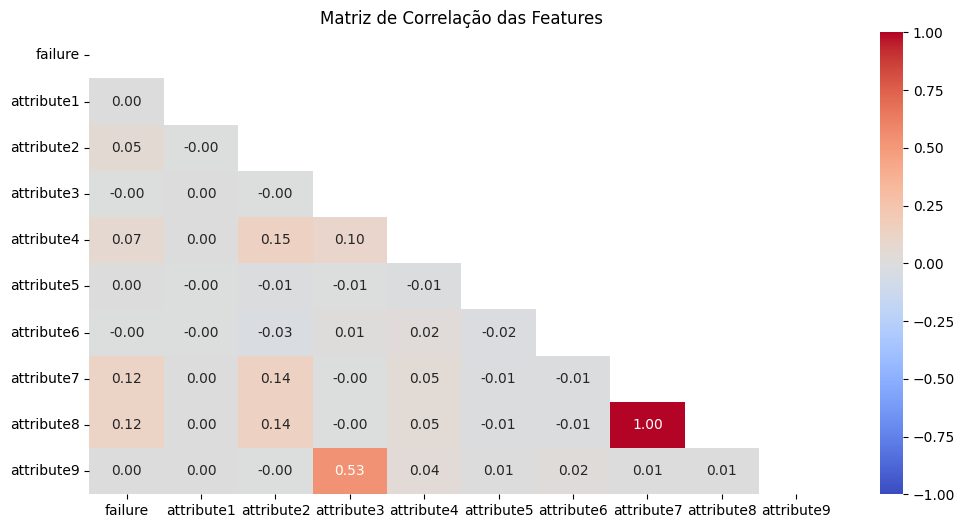

In [84]:
numeric_values = df.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(12, 6))
corr = df[numeric_values].corr()
mask = np.triu(np.ones_like(corr, dtype= bool ))
sns.heatmap(corr, mask =mask, annot = True, fmt = ".2f", cmap = "coolwarm", vmin =-1, vmax = 1)
plt.title('Matriz de Correlação das Features')
plt.show

**Análise da distribuição dos dados**

A análise foi realizada após a remoção de *outliers* para focar no comportamento central dos dados. 
O eixo y est'a em escala logaritimica para auxiliar na visualização devido a dispersão dos dados.

- Olhando as distribuições a a correlação (1.00) entre as features, é possível ver que `attribute 7` e `attribute 8` são identicos;
- `attribute3` e `attribute9` tem uma forte correlação positiva 0.53;
- Dentre todos os atributos analisados, ~attribute6~ é o que apresenta a distribuição mais homogênea e menos assimétrica.

In [85]:
df_model = df.copy()
df_model.drop(['attribute8'], axis=1, inplace=True)

In [86]:
# Criando algumas colunas temporais
df_model['day_of_week'] = df_model['date'].dt.dayofweek
df_model['is_weekend'] = df_model['day_of_week'].isin([5, 6]).astype(int)

In [87]:
# Cria'c~ao de colunas de lag para os atributos 
df_model = df_model.sort_values(by=['device', 'date'])
attributes = ['attribute1', 'attribute2', 'attribute3', 'attribute4', 'attribute5', 'attribute6', 'attribute7', 'attribute9']
lag_days = [1, 3] 

for lag in lag_days:
    for col in attributes:
        df_model[f'{col}_lag_{lag}'] = df_model.groupby('device')[col].shift(lag)


# média móvel e o desvio padrão móvel para uma janela de 7 dias
window_size = 7

for col in attributes:
    df_model[f'{col}_rolling_mean_{window_size}'] = df_model.groupby('device')[col].transform(
        lambda x: x.rolling(window=window_size, min_periods=1).mean()
    )

    df_model[f'{col}_rolling_std_{window_size}'] = df_model.groupby('device')[col].transform(
        lambda x: x.rolling(window=window_size, min_periods=1).std()
    )

df_model.head()

,date,device,failure,attribute1,attribute2,attribute3,attribute4,attribute5,attribute6,attribute7,...,attribute4_rolling_mean_7,attribute4_rolling_std_7,attribute5_rolling_mean_7,attribute5_rolling_std_7,attribute6_rolling_mean_7,attribute6_rolling_std_7,attribute7_rolling_mean_7,attribute7_rolling_std_7,attribute9_rolling_mean_7,attribute9_rolling_std_7
0,2015-01-01,S1F01085,0,215630672,56,0,52,6,407438,0,...,52.0,NaN,6.0,NaN,407438.00,NaN,0.0,NaN,7.0,NaN
1163,2015-01-02,S1F01085,0,1650864,56,0,52,6,407438,0,...,52.0,0.0,6.0,0.0,407438.00,0.000000,0.0,0.0,7.0,0.0
2326,2015-01-03,S1F01085,0,124017368,56,0,52,6,407438,0,...,52.0,0.0,6.0,0.0,407438.00,0.000000,0.0,0.0,7.0,0.0
3489,2015-01-04,S1F01085,0,128073224,56,0,52,6,407439,0,...,52.0,0.0,6.0,0.0,407438.25,0.500000,0.0,0.0,7.0,0.0
4651,2015-01-05,S1F01085,0,97393448,56,0,52,6,408114,0,...,52.0,0.0,6.0,0.0,407573.40,302.204897,0.0,0.0,7.0,0.0


## Modelagem

#### Treino e Teste

Divisão entre treino e teste de forma estratificada e de modo que o device não apareça no treino e teste.

In [88]:
X = df_model.drop(['date','device', 'failure'], axis=1)
y = df_model['failure']
groups = df_model['device']

print("Class distribution:\n", y.value_counts(normalize=True))

# Divisão em treino e teste
# Realizar um kfold para que não tenha o mesmo device no treino e teste
sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

for train_idx, test_idx in sgkf.split(X, y, groups):
    X_train = X.iloc[train_idx]
    y_train = y.iloc[train_idx]
    
    X_test = X.iloc[test_idx]
    y_test = y.iloc[test_idx]
    
    train_devices = groups.iloc[train_idx]
    test_devices = groups.iloc[test_idx]

    break

print("Distribuição de falhas no treino:\n", y_train.value_counts(normalize=True))
print("\nDistribuição de falhas no teste:\n", y_test.value_counts(normalize=True))

Class distribution:
 failure
0    0.999149
1    0.000851
Name: proportion, dtype: float64
Distribuição de falhas no treino:
 failure
0    0.999114
1    0.000886
Name: proportion, dtype: float64

Distribuição de falhas no teste:
 failure
0    0.999284
1    0.000716
Name: proportion, dtype: float64


In [89]:
print(X_test.shape, X_train.shape, y_test.shape, y_train.shape)

(25147, 42) (99347, 42) (25147,) (99347,)


## Modelo de Regressão Logística

In [90]:
num_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('std_scaler', StandardScaler())
])

model = make_pipeline(num_pipe, LogisticRegression(max_iter=500))

In [91]:
set_config(display='diagram')
model

,steps,"[('pipeline', ...), ('logisticregression', ...)]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('imputer', ...), ('std_scaler', ...)]"
,transform_input,None
,memory,None
,verbose,False
,missing_values,nan
,strategy,'median'
,fill_value,None


In [92]:
_ = model.fit(X_train, y_train)

In [93]:
# previsao
y_pred = model.predict(X_test)

# metricas do modelo
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     25129
           1       0.00      0.00      0.00        18

    accuracy                           1.00     25147
   macro avg       0.50      0.50      0.50     25147
weighted avg       1.00      1.00      1.00     25147



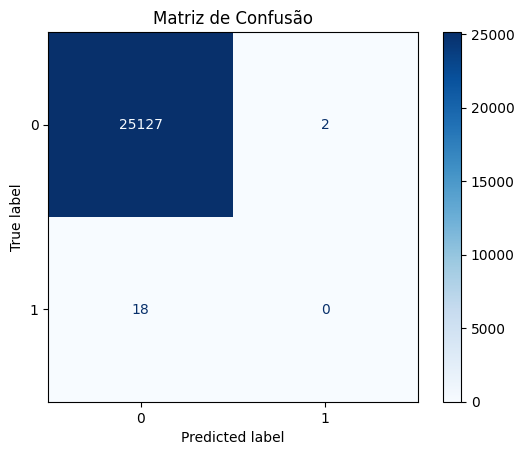

In [94]:
# matriz de confusao
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Matriz de Confusão')
plt.show()

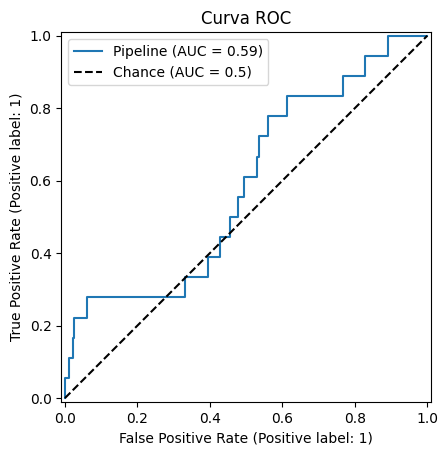

In [95]:
# curva roc
RocCurveDisplay.from_estimator(model, X_test, y_test)
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.title('Curva ROC')
plt.legend()
plt.show()

In [96]:
# probabilidade de falha
y_scores = model.predict_proba(X_test)[:, 1]

# calcular o lift por decil
df_lift = pd.DataFrame({
    'y_true': y_test,
    'y_score': y_scores
})

df_lift = df_lift.sort_values(by='y_score', ascending=False)

df_lift['decil'] = pd.qcut(df_lift['y_score'], 10, labels=np.arange(1, 11))

lift_table = df_lift.groupby('decil')['y_true'].agg(['sum', 'count']).rename(columns={'sum': 'n_positivos'})

# Taxa de resposta média 
taxa_resposta_media = df_lift['y_true'].mean()

# Taxa de resposta por decil
lift_table['taxa_resposta_decil'] = lift_table['n_positivos'] / lift_table['count']

# Lift
lift_table['lift'] = lift_table['taxa_resposta_decil'] / taxa_resposta_media

lift_table.head(n=10)

/tmp/ipykernel_1521/386532151.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,n_positivos,count,taxa_resposta_decil,lift
decil,,,,
1,0,2515,0.000000,0.000000
2,2,2515,0.000795,1.110979
3,1,2514,0.000398,0.555710
4,1,2515,0.000398,0.555489
5,3,2515,0.001193,1.666468
6,4,2514,0.001591,2.222841
7,2,2515,0.000795,1.110979
8,0,2514,0.000000,0.000000
9,0,2515,0.000000,0.000000


/tmp/ipykernel_1521/1512554143.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




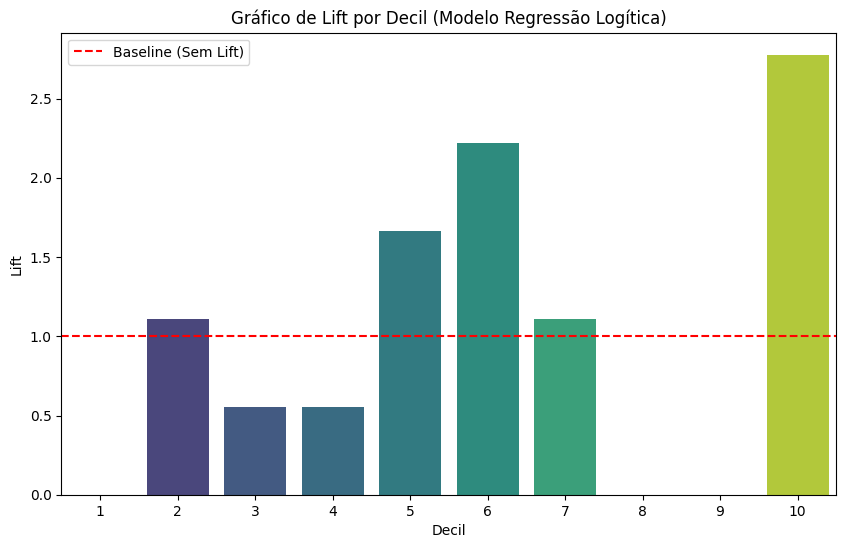

In [97]:
# Plotar o Gráfico de Lift
plt.figure(figsize=(10, 6))
ax_lift = sns.barplot(x=lift_table.index, y=lift_table['lift'], palette="viridis")
ax_lift.axhline(y=1, color='red', linestyle='--', label='Baseline (Sem Lift)')
plt.title('Gráfico de Lift por Decil (Modelo Regressão Logítica)')
plt.ylabel('Lift')
plt.xlabel('Decil')
plt.legend()
plt.show()


## Modelo de Análise Linear Discriminante (LDA)

In [98]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
model = make_pipeline(num_pipe, LinearDiscriminantAnalysis())
model

,steps,"[('pipeline', ...), ('lineardiscriminantanalysis', ...)]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('imputer', ...), ('std_scaler', ...)]"
,transform_input,None
,memory,None
,verbose,False
,missing_values,nan
,strategy,'median'
,fill_value,None


In [99]:
_ = model.fit(X_train,  y_train)

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     25129
           1       0.01      0.11      0.01        18

    accuracy                           0.99     25147
   macro avg       0.50      0.55      0.50     25147
weighted avg       1.00      0.99      0.99     25147



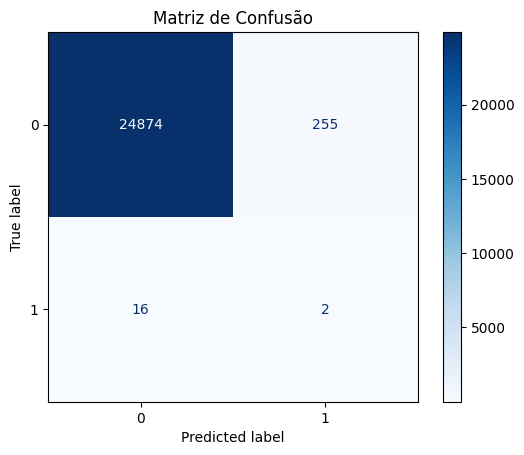

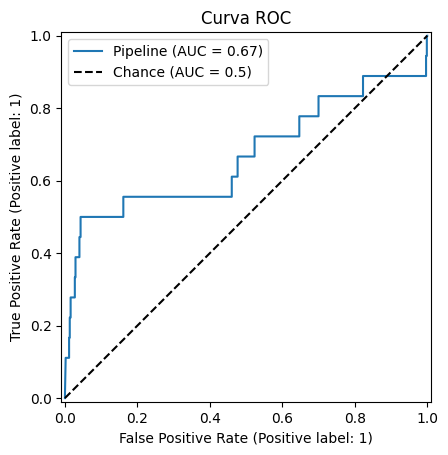

/tmp/ipykernel_1521/1399773335.py:32: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_1521/1399773335.py:47: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




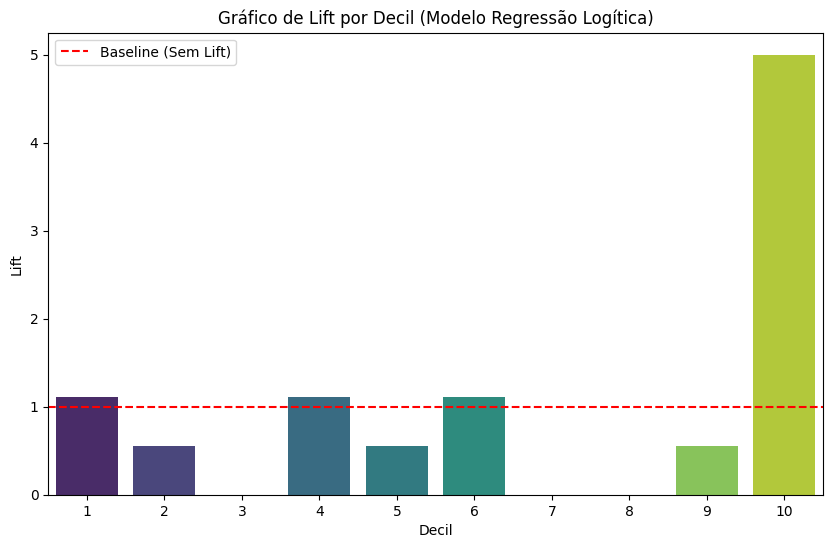

In [100]:
# previsao
y_pred = model.predict(X_test)

# metricas do modelo
print(classification_report(y_test, y_pred))

# matriz de confusao
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Matriz de Confusão')
plt.show()

# curva roc
RocCurveDisplay.from_estimator(model, X_test, y_test)
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.title('Curva ROC')
plt.legend()
plt.show()

# probabilidade de falha
y_scores = model.predict_proba(X_test)[:, 1]

# calcular o lift por decil
df_lift = pd.DataFrame({
    'y_true': y_test,
    'y_score': y_scores
})

df_lift = df_lift.sort_values(by='y_score', ascending=False)

df_lift['decil'] = pd.qcut(df_lift['y_score'], 10, labels=np.arange(1, 11))

lift_table = df_lift.groupby('decil')['y_true'].agg(['sum', 'count']).rename(columns={'sum': 'n_positivos'})

# Taxa de resposta média 
taxa_resposta_media = df_lift['y_true'].mean()

# Taxa de resposta por decil
lift_table['taxa_resposta_decil'] = lift_table['n_positivos'] / lift_table['count']

# Lift
lift_table['lift'] = lift_table['taxa_resposta_decil'] / taxa_resposta_media

lift_table.head(n=10)

# Plotar o Gráfico de Lift
plt.figure(figsize=(10, 6))
ax_lift = sns.barplot(x=lift_table.index, y=lift_table['lift'], palette="viridis")
ax_lift.axhline(y=1, color='red', linestyle='--', label='Baseline (Sem Lift)')
plt.title('Gráfico de Lift por Decil (Modelo Regressão Logítica)')
plt.ylabel('Lift')
plt.xlabel('Decil')
plt.legend()
plt.show()


## Modelo de Regressão Logística com adaptação dos parâmetros

In [101]:
model = make_pipeline(num_pipe, LogisticRegression(penalty='l2', solver='saga', max_iter=5000, class_weight='balanced', random_state=42, n_jobs=-1))
model

,steps,"[('pipeline', ...), ('logisticregression', ...)]"
,transform_input,None
,memory,None
,verbose,False
,steps,"[('imputer', ...), ('std_scaler', ...)]"
,transform_input,None
,memory,None
,verbose,False
,missing_values,nan
,strategy,'median'
,fill_value,None


In [102]:
_ = model.fit(X_train,  y_train)

              precision    recall  f1-score   support

           0       1.00      0.95      0.98     25129
           1       0.01      0.44      0.01        18

    accuracy                           0.95     25147
   macro avg       0.50      0.70      0.49     25147
weighted avg       1.00      0.95      0.98     25147



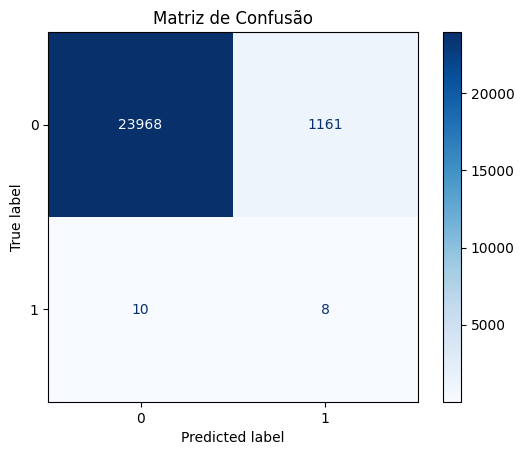

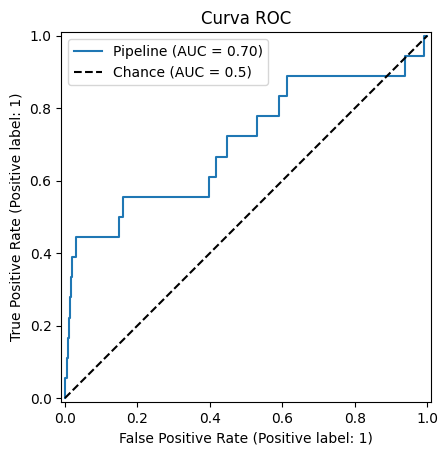

/tmp/ipykernel_1521/3140885447.py:32: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_1521/3140885447.py:47: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




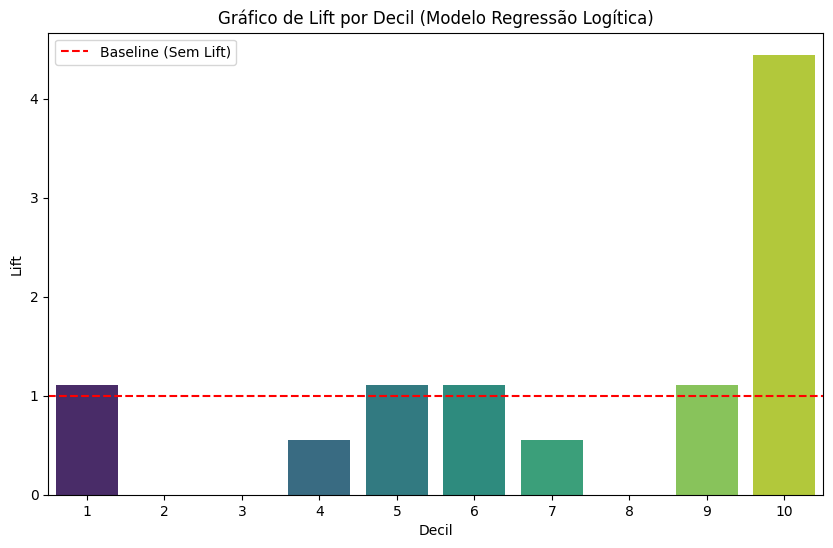

In [103]:
# previsao
y_pred = model.predict(X_test)

# metricas do modelo
print(classification_report(y_test, y_pred))

# matriz de confusao
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Matriz de Confusão')
plt.show()

# curva roc
RocCurveDisplay.from_estimator(model, X_test, y_test)
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.title('Curva ROC')
plt.legend()
plt.show()

# probabilidade de falha
y_scores = model.predict_proba(X_test)[:, 1]

# calcular o lift por decil
df_lift = pd.DataFrame({
    'y_true': y_test,
    'y_score': y_scores
})

df_lift = df_lift.sort_values(by='y_score', ascending=False)

df_lift['decil'] = pd.qcut(df_lift['y_score'], 10, labels=np.arange(1, 11))

lift_table = df_lift.groupby('decil')['y_true'].agg(['sum', 'count']).rename(columns={'sum': 'n_positivos'})

# Taxa de resposta média 
taxa_resposta_media = df_lift['y_true'].mean()

# Taxa de resposta por decil
lift_table['taxa_resposta_decil'] = lift_table['n_positivos'] / lift_table['count']

# Lift
lift_table['lift'] = lift_table['taxa_resposta_decil'] / taxa_resposta_media

lift_table.head(n=10)

# Lift
plt.figure(figsize=(10, 6))
ax_lift = sns.barplot(x=lift_table.index, y=lift_table['lift'], palette="viridis")
ax_lift.axhline(y=1, color='red', linestyle='--', label='Baseline (Sem Lift)')
plt.title('Gráfico de Lift por Decil (Modelo Regressão Logítica)')
plt.ylabel('Lift')
plt.xlabel('Decil')
plt.legend()
plt.show()


## Teste dos modelos da biblioteca imblearn para dados desbalanceados

In [104]:
classifiers = {
    'EasyEnsemble': EasyEnsembleClassifier(
        n_estimators=50, random_state=42
    ),
    'RUSBoost': RUSBoostClassifier(
        n_estimators=50, random_state=42
    ),
    'BalancedBagging': BalancedBaggingClassifier(
        n_estimators=50, random_state=42
    ),
    'BalancedRandomForest': BalancedRandomForestClassifier(
        n_estimators=50, random_state=42
    )
}

results = {}

for name, clf in classifiers.items():
    print(f"\n=== {name} ===")
    
    model_pipeline = make_pipeline(num_pipe, clf)
    model_pipeline.fit(X_train, y_train)
    y_pred = model_pipeline.predict(X_test)
    y_proba = model_pipeline.predict_proba(X_test)[:, 1]

    results[name] = {
        'pipeline': model_pipeline,  
        'predictions': y_pred,
        'probabilities': y_proba,
        'roc_auc': roc_auc_score(y_test, y_proba)
    }
    
    print(f"ROC AUC: {results[name]['roc_auc']:.4f}")
    print(classification_report(y_test, y_pred))
    print(confusion_matrix(y_test, y_pred))


=== EasyEnsemble ===
ROC AUC: 0.8849
              precision    recall  f1-score   support

           0       1.00      0.91      0.95     25129
           1       0.01      0.72      0.01        18

    accuracy                           0.91     25147
   macro avg       0.50      0.82      0.48     25147
weighted avg       1.00      0.91      0.95     25147

[[22873  2256]
 [    5    13]]

=== RUSBoost ===
ROC AUC: 0.7526
              precision    recall  f1-score   support

           0       1.00      0.89      0.94     25129
           1       0.00      0.61      0.01        18

    accuracy                           0.89     25147
   macro avg       0.50      0.75      0.48     25147
weighted avg       1.00      0.89      0.94     25147

[[22470  2659]
 [    7    11]]

=== BalancedBagging ===
ROC AUC: 0.8736
              precision    recall  f1-score   support

           0       1.00      0.90      0.95     25129
           1       0.01      0.72      0.01        18

    acc

### Ajuste de parâmetros para o BalancedRandomForest 

In [105]:
model_pipeline = make_pipeline(num_pipe, BalancedRandomForestClassifier(random_state=42))

# grid search
param_grid = {
    'balancedrandomforestclassifier__n_estimators': [100, 200, 300],
    'balancedrandomforestclassifier__max_depth': [None, 5, 10, 20],
    'balancedrandomforestclassifier__min_samples_leaf': [1, 2],
    'balancedrandomforestclassifier__max_features': ['sqrt', 'log2'],
    'balancedrandomforestclassifier__class_weight': ['balanced_subsample'],
    'balancedrandomforestclassifier__sampling_strategy': ['auto', 0.7, 0.9],
    'balancedrandomforestclassifier__criterion': ['gini', 'entropy']
}

grid_search = GridSearchCV(
    estimator=model_pipeline, 
    param_grid=param_grid,
    scoring='roc_auc',
    cv=3,
    n_jobs=-1,
    verbose=2
)

grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits
[CV] END balancedrandomforestclassifier__class_weight=balanced_subsample, balancedrandomforestclassifier__criterion=gini, balancedrandomforestclassifier__max_depth=None, balancedrandomforestclassifier__max_features=sqrt, balancedrandomforestclassifier__min_samples_leaf=1, balancedrandomforestclassifier__n_estimators=100, balancedrandomforestclassifier__sampling_strategy=auto; total time=   3.8s
[CV] END balancedrandomforestclassifier__class_weight=balanced_subsample, balancedrandomforestclassifier__criterion=gini, balancedrandomforestclassifier__max_depth=None, balancedrandomforestclassifier__max_features=sqrt, balancedrandomforestclassifier__min_samples_leaf=1, balancedrandomforestclassifier__n_estimators=100, balancedrandomforestclassifier__sampling_strategy=auto; total time=   4.1s
[CV] END balancedrandomforestclassifier__class_weight=balanced_subsample, balancedrandomforestclassifier__criterion=gini, balancedrandomfores

,estimator,Pipeline(step...m_state=42))])
,param_grid,"{'balancedrandomforestclassifier__class_weight': ['balanced_subsample'], 'balancedrandomforestclassifier__criterion': ['gini', 'entropy'], 'balancedrandomforestclassifier__max_depth': [None, 5, ...], 'balancedrandomforestclassifier__max_features': ['sqrt', 'log2'], ...}"
,scoring,'roc_auc'
,n_jobs,-1
,refit,True
,cv,3
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,steps,"[('imputer', ...), ('std_scaler', ...)]"


In [106]:
# Exiba os melhores resultados
print("\nMelhores parâmetros encontrados:")
print(grid_search.best_params_)
print("\nMelhor roc_auc na validação cruzada:")
print(grid_search.best_score_)


Melhores parâmetros encontrados:
{'balancedrandomforestclassifier__class_weight': 'balanced_subsample', 'balancedrandomforestclassifier__criterion': 'entropy', 'balancedrandomforestclassifier__max_depth': None, 'balancedrandomforestclassifier__max_features': 'log2', 'balancedrandomforestclassifier__min_samples_leaf': 1, 'balancedrandomforestclassifier__n_estimators': 200, 'balancedrandomforestclassifier__sampling_strategy': 0.7}

Melhor roc_auc na validação cruzada:
0.8592173081140007


              precision    recall  f1-score   support

           0       1.00      0.90      0.95     25129
           1       0.01      0.72      0.01        18

    accuracy                           0.90     25147
   macro avg       0.50      0.81      0.48     25147
weighted avg       1.00      0.90      0.95     25147



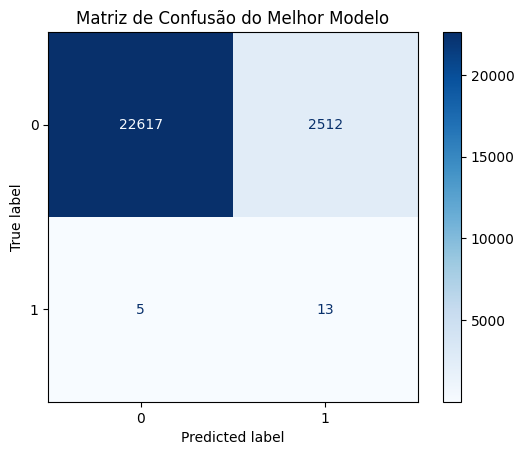

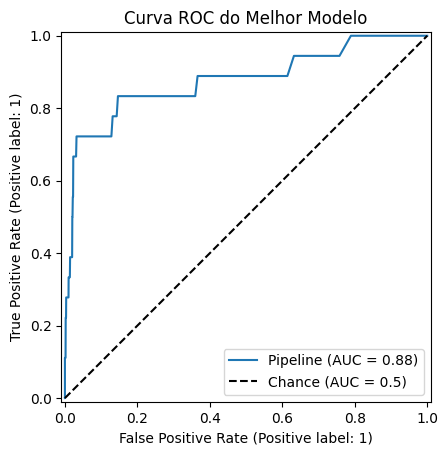


Tabela de Lift:
       n_positivos  count  taxa_resposta_decil      lift
decil                                                   
1                0   3447             0.000000  0.000000
2                0   1848             0.000000  0.000000
3                1   2256             0.000443  0.619262
4                1   2613             0.000383  0.534656
5                0   2547             0.000000  0.000000
6                0   2519             0.000000  0.000000
7                1   2392             0.000418  0.584053
8                0   2507             0.000000  0.000000
9                2   2585             0.000774  1.080894
10              13   2433             0.005343  7.464744


/tmp/ipykernel_1521/469784710.py:34: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




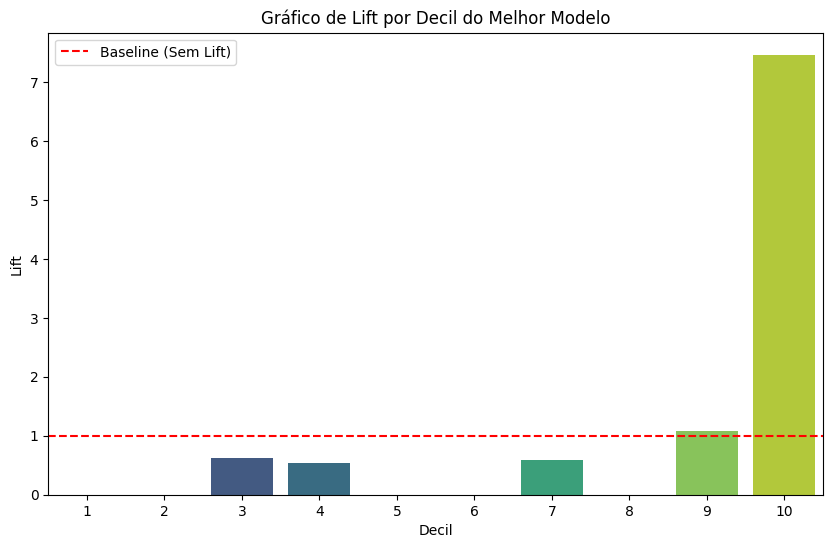

In [107]:
best_model = grid_search.best_estimator_ 

# Métricas
y_pred = best_model.predict(X_test)
print(classification_report(y_test, y_pred))

ConfusionMatrixDisplay.from_estimator(best_model, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Matriz de Confusão do Melhor Modelo')
plt.show()

# Curva ROC
RocCurveDisplay.from_estimator(best_model, X_test, y_test)
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.title('Curva ROC do Melhor Modelo')
plt.legend()
plt.show()

# Lift
y_scores = best_model.predict_proba(X_test)[:, 1]

df_lift = pd.DataFrame({'y_true': y_test, 'y_score': y_scores})
df_lift = df_lift.sort_values(by='y_score', ascending=False)
df_lift['decil'] = pd.qcut(df_lift['y_score'], 10, labels=False, duplicates='drop') + 1

lift_table = df_lift.groupby('decil')['y_true'].agg(['sum', 'count']).rename(columns={'sum': 'n_positivos'})
taxa_resposta_media = df_lift['y_true'].mean()
lift_table['taxa_resposta_decil'] = lift_table['n_positivos'] / lift_table['count']
lift_table['lift'] = lift_table['taxa_resposta_decil'] / taxa_resposta_media

print("\nTabela de Lift:")
print(lift_table.head(n=10))

plt.figure(figsize=(10, 6))
ax_lift = sns.barplot(x=lift_table.index, y=lift_table['lift'], palette="viridis")
ax_lift.axhline(y=1, color='red', linestyle='--', label='Baseline (Sem Lift)')
plt.title('Gráfico de Lift por Decil do Melhor Modelo')
plt.ylabel('Lift')
plt.xlabel('Decil')
plt.legend()
plt.show()

### LightGBM 

In [108]:
%%capture
contagem_negativos = np.sum(y_train == 0)
contagem_positivos = np.sum(y_train == 1)
scale_pos_weight_calculado = contagem_negativos / contagem_positivos

print(f"Valor calculado para scale_pos_weight: {scale_pos_weight_calculado:.2f}")

# pipeline com o LightGBM
pipeline_lgbm  = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('std_scaler', StandardScaler()),
    ('model', lgb.LGBMClassifier(random_state=42))
])

# grid search
param_grid_lgbm = [
    # Experimento 1
    {
        'model__is_unbalance': [False], 
        'model__scale_pos_weight': [scale_pos_weight_calculado],
        'model__n_estimators': [100, 200, 300],
        'model__learning_rate': [0.05, 0.1],
        'model__num_leaves': [20, 31, 40],
        'model__reg_lambda': [0.1, 1.0]
    },
    
    # Experimento 2
    {
        'model__is_unbalance': [True], 
        'model__scale_pos_weight': [1], 
        'model__n_estimators': [100, 200, 300],
        'model__learning_rate': [0.05, 0.1],
        'model__num_leaves': [20, 31, 40],
        'model__reg_lambda': [0.1, 1.0]
    }
]  

grid_search_lgbm = GridSearchCV(
    estimator=pipeline_lgbm,
    param_grid=param_grid_lgbm,
    scoring='roc_auc',  
    cv=3,
    n_jobs=-1,
    verbose=2
)

grid_search_lgbm.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.169995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.556496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.5min
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.5min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.901279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from s

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.3min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.802868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.863774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.6min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.367949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.8min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.711708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.814492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.0min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.192790 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.1min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.695947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 1.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.815743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.785025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.807706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.2min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.821792 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.2min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.892819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 3.2min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.799770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 4.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.723633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 1.8min
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Tot

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 4.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.791768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 3.4min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.804044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 4.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.775583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 4.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.823296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.756054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 4.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.787663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 4.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.747645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.779712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGB

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.767688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 6.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.785225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.814896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[Li

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.803686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_c

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 4.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.831427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGB

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 8.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.705134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 7.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.1min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.775841 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 6.5min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.849942 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 4.5min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.919650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 4.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.821041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 8.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.772263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[Li

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.803450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGB

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 8.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 9.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 8.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.863790 seconds.
You can set `force_row_wise=true

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 7.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 6.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.156086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.787548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, bes

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.629221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time=12.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.995051 seconds.
You can set `force_row_wise=true

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.6min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.831728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 1.8min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.295771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.0min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.455717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.1min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.723693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 6.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.810613 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 6.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.9min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.725014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.737173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.359129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.159199 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 1.5min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.751135 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=F

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time=  33.8s[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=F

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.655009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warnin

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.9min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.795784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.855633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_co

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Wa

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves t

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.0min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.791767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.9min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.735672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.819697 seconds.
You

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 2.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.144665 seconds.
You can set `force_col_wise=true`

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.731736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 2.5min


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 3.1min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.459632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time=  46.3s
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 4.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 3.0min


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 7.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of neg

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 5.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.838307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.559608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.5min
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Wa

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 1.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.788545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 5.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 4.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 4.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.567954 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 7.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 3.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.495775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 7.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 6.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 8.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.786602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_co

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testi

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.785836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Sta

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 6.1min
[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1127.9431818181818; total time= 6.1min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.859893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Info] Auto-choosing row-wise multi-thre

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 8.9min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.895626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.0min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.818811 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 1.4min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.438271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.0min


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.4min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.838236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.899046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.691993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 1.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.735980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.689697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 4.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time= 8.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.687840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise m

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.835718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=False, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1127.9431818181818; total time=10.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.751712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No f

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.0min
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.1min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.990702 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Info] Aut

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.399880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.811772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.879946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.4min
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.2min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.866418 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.5min


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.5min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.822641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.711617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 6.0min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.843947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 3.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.911679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Sta

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.4min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.787950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM]

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 5.5min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.932168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.9min[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testi

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 8.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 4.9min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.296204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.231894 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 5.8min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.751695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.567666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 8.7min
[LightGBM] [Info] Number of positive: 59, number of negative: 66172


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 4.2min
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.811809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.408291 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightG

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 7.6min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.879692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 9.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.801175 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 8.7min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.865825 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.8min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.888095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.152767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 9.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 7.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testi

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 7.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.609206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in t

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 8.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.671655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 8.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.868718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in t

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 8.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.859416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 7.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time=  55.5s
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.703582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Star

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.868946 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 1.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.783711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.831767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 5.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.016819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Sta

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 1.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.136545 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:B

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 1.6min[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.719644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:B

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.805518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 7.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 9.0min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.515973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.786750 seconds.
You can set `force_r

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.05, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 7.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.715782 seconds.
You can set `force_row_wise=true` to remove the ov

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 1.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.879731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Star

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.915757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time=  34.2s
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.271661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.875744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in th

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.3min
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.802672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positi

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.952377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:B

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 3.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.165174 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in th

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 3.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=100, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.2min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testin

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 2.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.2min
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.584582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in the train set: 66232, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022490
[LightGBM] [Info] Start training from score -7.022490
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.837326 seconds.
You can set `force_ro

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 6.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[Light

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 4.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time=  45.2s
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.253743 seconds.
You can set `force_row_wise=true` to remove the ove

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 4.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.855438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in th

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testin

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.736089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Warning] No further splits with

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 6.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.3min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 1.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, be

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=200, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.7min
[LightGBM] [Warning] No further 

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.0min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testin

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.8min


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.8min
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.770944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4978
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000876 -> initscore=-7.039585
[LightGBM] [Info] Start training from score -7.039585
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.859953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5128
[Lig

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 4.6min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66172
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.882391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4865
[LightGBM] [Info] Number of data points in the train set: 66231, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000891 -> initscore=-7.022475
[LightGBM] [Info] Start training from score -7.022475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=20, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 6.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 58, number of negative: 66173
[Ligh

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 2.2min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 59, number of negative: 66173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.795769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5128
[LightGBM] [Info] Number of data points in th

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 3.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.8min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.9min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=31, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 7.1min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 5.5min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=0.1, model__scale_pos_weight=1; total time= 5.7min
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 3.6min
[CV] END model__is_unbalance=True, model__learning_rate=0.1, model__n_estimators=300, model__num_leaves=40, model__reg_lambda=1.0, model__scale_pos_weight=1; total time= 3.9min


Melhores parâmetros encontrados:
{'model__is_unbalance': False, 'model__learning_rate': 0.1, 'model__n_estimators': 100, 'model__num_leaves': 40, 'model__reg_lambda': 1.0, 'model__scale_pos_weight': np.float64(1127.9431818181818)}

Melhor score (roc_auc) na validação cruzada:
0.7056583130554063

--- Análise do Melhor Modelo LightGBM ---

Relatório de Classificação:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     25129
           1       0.02      0.33      0.03        18

    accuracy                           0.99     25147
   macro avg       0.51      0.66      0.51     25147
weighted avg       1.00      0.99      0.99     25147


Matriz de Confusão:


/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names



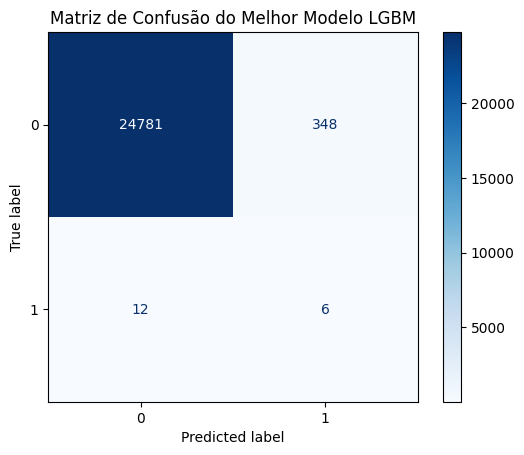

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names



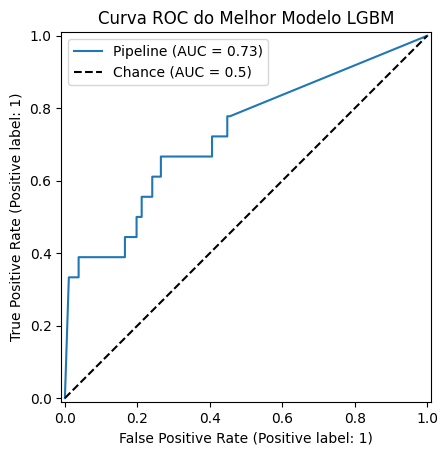

/home/elis/sabrina/mercado_libre_data_science_challenge/env/lib/python3.10/site-packages/sklearn/utils/validation.py:2749: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

/tmp/ipykernel_1521/3196587239.py:44: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.





Tabela de Lift:
       n_positivos  count  taxa_resposta_decil      lift
decil                                                   
1                6  15088             0.000398  0.555563
2                0   2515             0.000000  0.000000
3                3   2514             0.001193  1.667131
4                2   2515             0.000795  1.110979
5                7   2515             0.002783  3.888425


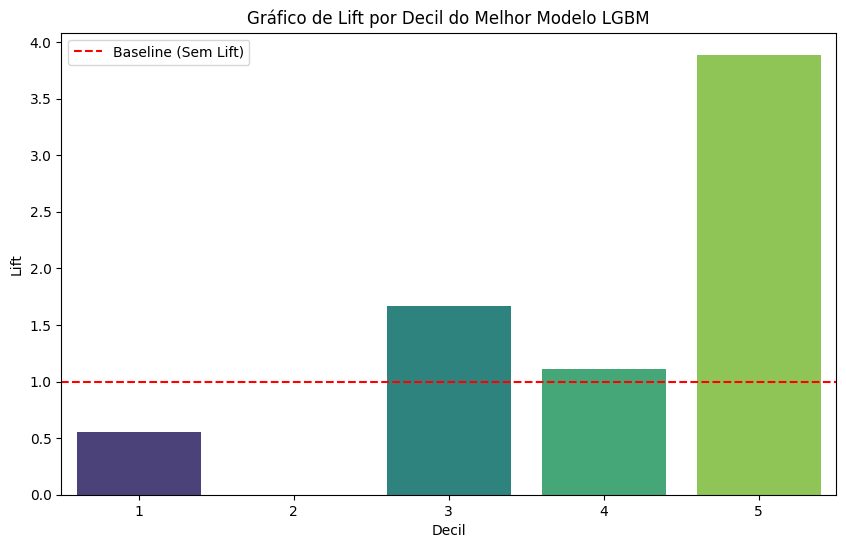

In [109]:
# best model
print("Melhores parâmetros encontrados:")
print(grid_search_lgbm.best_params_)
print("\nMelhor score (roc_auc) na validação cruzada:")
print(grid_search_lgbm.best_score_)

best_model_lgbm = grid_search_lgbm.best_estimator_

# Matriz de Confusão
print("\n--- Análise do Melhor Modelo LightGBM ---")
print("\nRelatório de Classificação:")
y_pred = best_model_lgbm.predict(X_test) 
print(classification_report(y_test, y_pred))

print("\nMatriz de Confusão:")
ConfusionMatrixDisplay.from_estimator(best_model_lgbm, X_test, y_test, cmap=plt.cm.Blues)
plt.title('Matriz de Confusão do Melhor Modelo LGBM')
plt.show()


# Curva ROC
RocCurveDisplay.from_estimator(best_model_lgbm, X_test, y_test)
plt.plot([0, 1], [0, 1], 'k--', label='Chance (AUC = 0.5)')
plt.title('Curva ROC do Melhor Modelo LGBM')
plt.legend()
plt.show()

# Lift
y_scores = best_model_lgbm.predict_proba(X_test)[:, 1]

df_lift = pd.DataFrame({'y_true': y_test, 'y_score': y_scores})
df_lift = df_lift.sort_values(by='y_score', ascending=False)
df_lift['decil'] = pd.qcut(df_lift['y_score'], 10, labels=False, duplicates='drop') + 1

lift_table = df_lift.groupby('decil')['y_true'].agg(['sum', 'count']).rename(columns={'sum': 'n_positivos'})
taxa_resposta_media = df_lift['y_true'].mean()
lift_table['taxa_resposta_decil'] = lift_table['n_positivos'] / lift_table['count']
lift_table['lift'] = lift_table['taxa_resposta_decil'] / taxa_resposta_media

print("\nTabela de Lift:")
print(lift_table.head(n=10))

plt.figure(figsize=(10, 6))
ax_lift = sns.barplot(x=lift_table.index, y=lift_table['lift'], palette="viridis")
ax_lift.axhline(y=1, color='red', linestyle='--', label='Baseline (Sem Lift)')
plt.title('Gráfico de Lift por Decil do Melhor Modelo LGBM')
plt.ylabel('Lift')
plt.xlabel('Decil')
plt.legend()
plt.show()

In [110]:



X_train_majority = X_train[y_train == 0]

param_grid = {
    'nu': [0.0001, 0.001, 0.005, 0.01, 0.2, 0.35]
}

# Grid Search
resultados_grid = []

for nu_valor in param_grid['nu']:
    print(f"Testando nu = {nu_valor}...")
    
    ocsvm_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy="median")),
        ('scaler', StandardScaler()),
        ('ocsvm', OneClassSVM(kernel='rbf', gamma='scale', nu=nu_valor)) 
    ])

    ocsvm_pipeline.fit(X_train_majority)
    
    y_pred_raw = ocsvm_pipeline.predict(X_test)
    y_pred = np.where(y_pred_raw == 1, 0, 1)
    f1 = f1_score(y_test, y_pred, pos_label=1)
    
    resultados_grid.append({'nu': nu_valor, 'f1_score': f1})
    print(f"  -> F1-Score (classe 1): {f1:.4f}")

df_resultados_grid = pd.DataFrame(resultados_grid)
melhor_parametro = df_resultados_grid.loc[df_resultados_grid['f1_score'].idxmax()]

print("\n Resultado Grid Search ")
print(df_resultados_grid)
print("\nMelhor valor de 'nu' encontrado")
print(melhor_parametro)


Testando nu = 0.0001...
  -> F1-Score (classe 1): 0.0158
Testando nu = 0.001...
  -> F1-Score (classe 1): 0.0158
Testando nu = 0.005...
  -> F1-Score (classe 1): 0.0156
Testando nu = 0.01...
  -> F1-Score (classe 1): 0.0136
Testando nu = 0.2...
  -> F1-Score (classe 1): 0.0047
Testando nu = 0.35...
  -> F1-Score (classe 1): 0.0027

 Resultado Grid Search 
       nu  f1_score
0  0.0001  0.015823
1  0.0010  0.015823
2  0.0050  0.015552
3  0.0100  0.013643
4  0.2000  0.004709
5  0.3500  0.002738

Melhor valor de 'nu' encontrado
nu          0.000100
f1_score    0.015823
Name: 0, dtype: float64


In [111]:
best_nu = melhor_parametro['nu']

# 5. Treinar o modelo final com o melhor 'nu' encontrado
print(f"\nTreinando modelo final com o melhor nu = {best_nu}...")
final_ocsvm_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('scaler', StandardScaler()),
    ('ocsvm', OneClassSVM(kernel='rbf', gamma='scale', nu=best_nu))
])

final_ocsvm_pipeline.fit(X_train_majority)

# melhor modelo
y_final_pred_raw = final_ocsvm_pipeline.predict(X_test)
y_final_pred = np.where(y_final_pred_raw == 1, 0, 1)

print(classification_report(y_test, y_final_pred))
print(confusion_matrix(y_test, y_final_pred))


Treinando modelo final com o melhor nu = 0.0001...
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     25129
           1       0.01      0.28      0.02        18

    accuracy                           0.98     25147
   macro avg       0.50      0.63      0.50     25147
weighted avg       1.00      0.98      0.99     25147

[[24520   609]
 [   13     5]]


### Conclusões
- Para o case de previsão de falha, foi selecionado o modelo `BalancedRandomForestClassifier`.
- A análise de Lift mostra que o modelo foi razoavelmente eficaz em separar os casos de maior risco ao focar nos 10% dos casos com maior probabilidade de falha. Dessa forma há uma concentração de falhas 7,46 vezes maior do que a média, concentrando 13 das 18 falhas totais do dataset de teste.
- Trade-off: No entanto o modelo ainda apresenta uma baixa precisão (1%), ou seja, a maioria dos alertas gerados não corresponderá a uma falha real. 
    - Pela matriz de confusão é poss;ível ver que, enquanto o modelo capturou 13 falhas, ele também classificou incorretamente 2.512 casos normais como "possíveis falhas".

- Alternativas:
    - Coletar mais informações sobre casos de falha, levantando novas variáveis que possam auxiliar na modelagem;
    - Aumentar o histórico de analise para que um maior número de falhas possa ser analisado;
    - Testar modelos mais robustos, como redes neurais para avaliar a performance nesse caso;
    - Maior aprofundamento nas `features` pode ajudar a compreender melhor os pontos de melhoria no pré-processamento do modelo.